# Cover song identification using 2D Fourier transform sequences

### Prem Seetharaman and Zafar Rafii, Summer 2016

This notebook presents a cover identification algorithm based on the Magnitude 2DFT.

Abstract: _We approach cover song identification using a novel time-series representation of audio based on the 2DFT. The audio is represented as a sequence of magnitude 2D Fourier Transforms (2DFT). This representation is robust to key changes, timbral changes, and small local tempo deviations. We look at cross-similarity between these time-series, and extract a distance measure that is invariant to music structure changes. Our approach is state-of-the-art on a recent cover song dataset, and expands on previous work using the 2DFT for music representation and work on live song recognition._

## Background

A cover version of a song is one that is performed by someone else other than the original artist. Many things can change between a cover version and the original version, such as:

- Key
- Tempo
- Instrumentation
- Music structure
- Genre

Successful automatic cover song identification approaches try to be invariant to these changes while keeping the aspects of music that are transferred from the original to the cover, such as:

- Chord progression
- Melody
- Signature rhythmic or harmonic patterns

Here are some examples! Each example has the CQT, the LiveID Fingerprint (explained later), and the audio file.

### Can't Help Falling In Love - Elvis Presley

First, the original song:

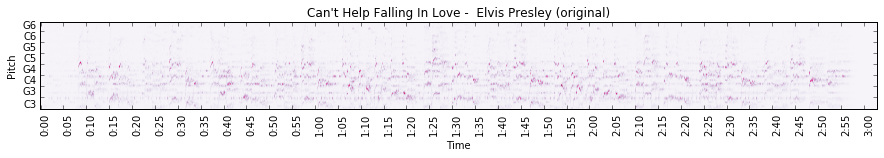

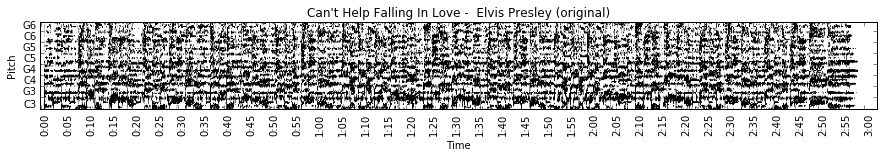

In [32]:
load_and_display("../datasets/Elvis Presley - Can't Help Falling In Love/Can't Help Falling In Love-5V430M59Yn8.mp3", 
                 "Can't Help Falling In Love -  Elvis Presley (original)", 2)

The original has a male singer, percussion, backing vocals, and guitar. The two covers below are drastically different in instrumentation, key, and structure. They also vary slightly in tempo. The melodic register is also very different.

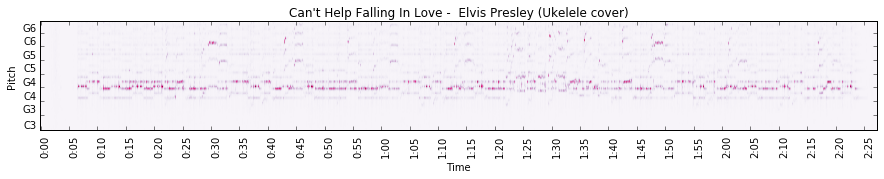

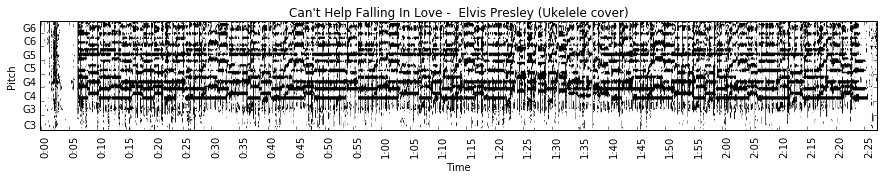

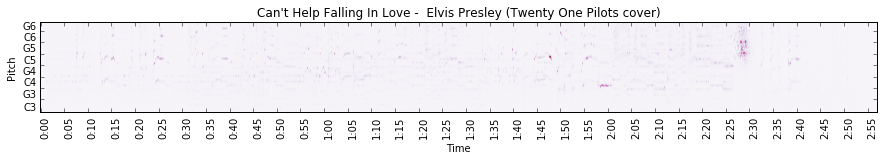

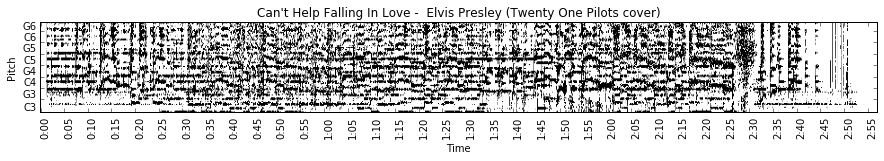

In [33]:
load_and_display("../datasets/Elvis Presley - Can't Help Falling In Love/Can't Help Falling in Love - Elvis Presley (Ukulele Cover by Stormy Amorette)-qlwnRhlh7ts.mp3", 
                 "Can't Help Falling In Love -  Elvis Presley (Ukelele cover)", 2)

load_and_display("../datasets/Elvis Presley - Can't Help Falling In Love/twenty one pilots - Can't Help Falling In Love (Cover)-6ThQkrXHdh4.mp3", 
                 "Can't Help Falling In Love -  Elvis Presley (Twenty One Pilots cover)", 2)

### Hotel California - The Eagles

First, the original:

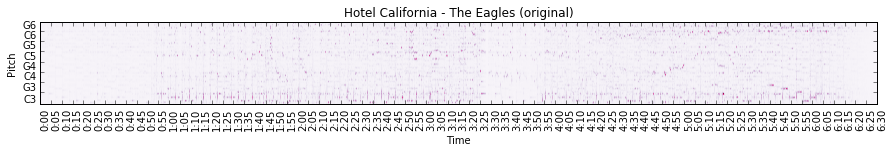

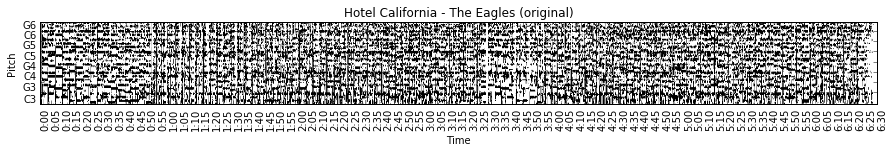

In [31]:
load_and_display("../datasets/Eagles - Hotel California/Eagles - Hotel California (Lyrics)-h0G1Ucw5HDg.mp3",
                 "Hotel California - The Eagles (original)", 4)

And now an a capella cover. Lots of things are maintained between the original and the cover here, structurally, but imitated entirely using the human voice. It is awful. Also, the key is a fourth higher in the cover.

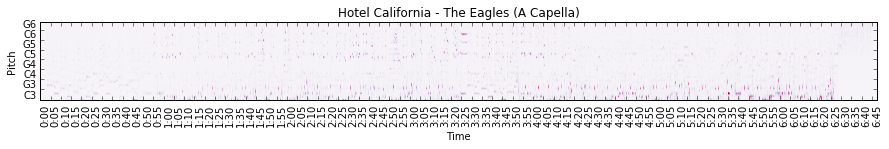

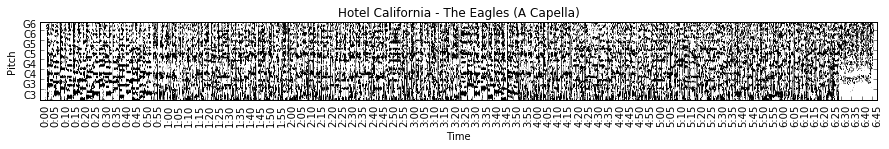

In [30]:
load_and_display("../datasets/Eagles - Hotel California/HOTEL CALIFORNIA por Vocal Sampling-_xj1ncF5hSY.mp3",
                 "Hotel California - The Eagles (A Capella)", 4)

### LiveID Fingerprint

In between cover song identification and audio fingerprinting, there is live song identification (LiveID). In LiveID, the task is to identify a live version of a studio reference. The live version is performed by the original artist. Tempo and key may vary slightly and the signal may be very degraded. To handle this, Rafii et al. propose a fingerprint based on adaptive thresholding. The process is illustrated below:

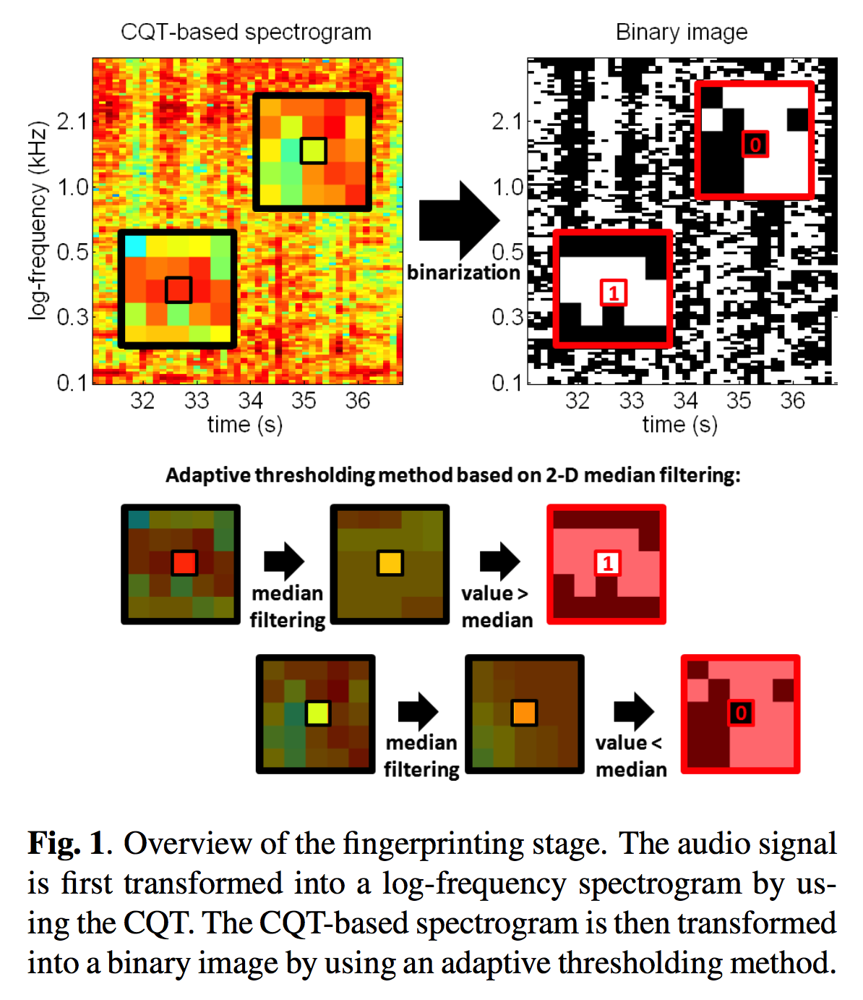

In [36]:
show_figure('fingerprinting.png', 400)

In this work, we use this binarized fingerprint as a starting point. It has the advantage of scrubbing timbral information, sound level changes while retaining overall melodic and rhythmic structure.

## Some attempts

### Cross-similarity between LiveID Fingerprints

In LiveID, you are given a 6 second noisy query taken off of a phone, and asked to identify that query in a larger reference set. However, some guarantees are made about how closely the live and original versions will match - it's the same artist, probably the same instruments, the tempo might be close, the key may be close or even the same. In cover song identification, all of these are up in the air, and the cover might be very different from the original. However, you have the advantage of doing full comparisons between the entire cover and the entire reference.

So if we take the LiveID fingerprints, we can compute the cross-similarity matrix as follows:

In [37]:
song_fp = load_file("../datasets/Elvis Presley - Can't Help Falling In Love/Can't Help Falling In Love-5V430M59Yn8.mp3")[-1]
cover_fp = load_file("../datasets/Elvis Presley - Can't Help Falling In Love/Can't Help Falling in Love - Elvis Presley (Ukulele Cover by Stormy Amorette)-qlwnRhlh7ts.mp3")[-1]
sim_matrices = fingerprint_similarity(song_fp, cover_fp, ap)

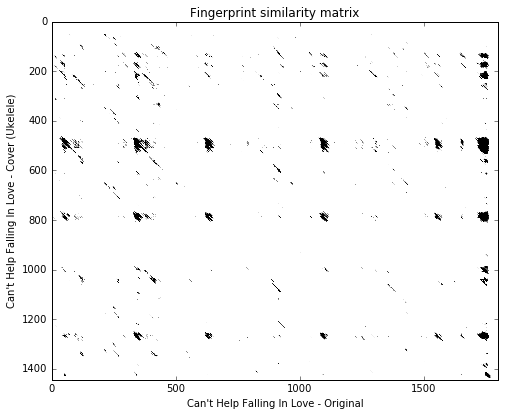

In [49]:
plt.figure(figsize=(8, 8))
plt.imshow(np.max(np.stack(sim_matrices), axis=0), cmap='Greys')
plt.title('Fingerprint similarity matrix')
plt.xlabel("Can't Help Falling In Love - Original")
plt.ylabel("Can't Help Falling In Love - Cover (Ukelele)")
plt.show()

The similarity matrix using LiveID Fingerprint is a bit noisy. There are some diagonal subsequence matches here and there, but it's overall very spotty. This is probably due to the difference in octave between the cover and reference. Doing this similarity matrix is also pretty costly, and, at large scale, can be a bit slow. Once you have this similarity matrix, however, you can do:
#### Dynamic time warping of fingerprint similarity matrix

This did not work very well for two reasons:

1. The fingerprint similarity matrix simply isn't that informative. You can do the pitch shifts and such, but it still relies on very similar frames matching over time. This can happen in LiveID, but in cover song identification, it won't happen as much.
2. Dynamic time warping is a global sequence alignment. Often in a cover song, aspects of the original will be retained (such as the chorus) while others will be removed or altered considerable. There may be, for example, an extended guitar solo placed in the middle of a Prince cover that is very dissimilar to the original. For this reason, we need to do subsequence matching, instead of global sequence alignment.

On covers80, a dataset consisting of 80 originals and 80 covers, this approach gets 35/80 true positives.

### LiveID subsequence matching

This is what's currently powering cover song identification. The cover song is split up into 20 second queries with 10 seconds overlap between consecutive queries. These queries are given to the LiveID matching scheme (shown below in an earlier form) to search a reference set. The output of LiveID is then filtered to remove spurious matches.

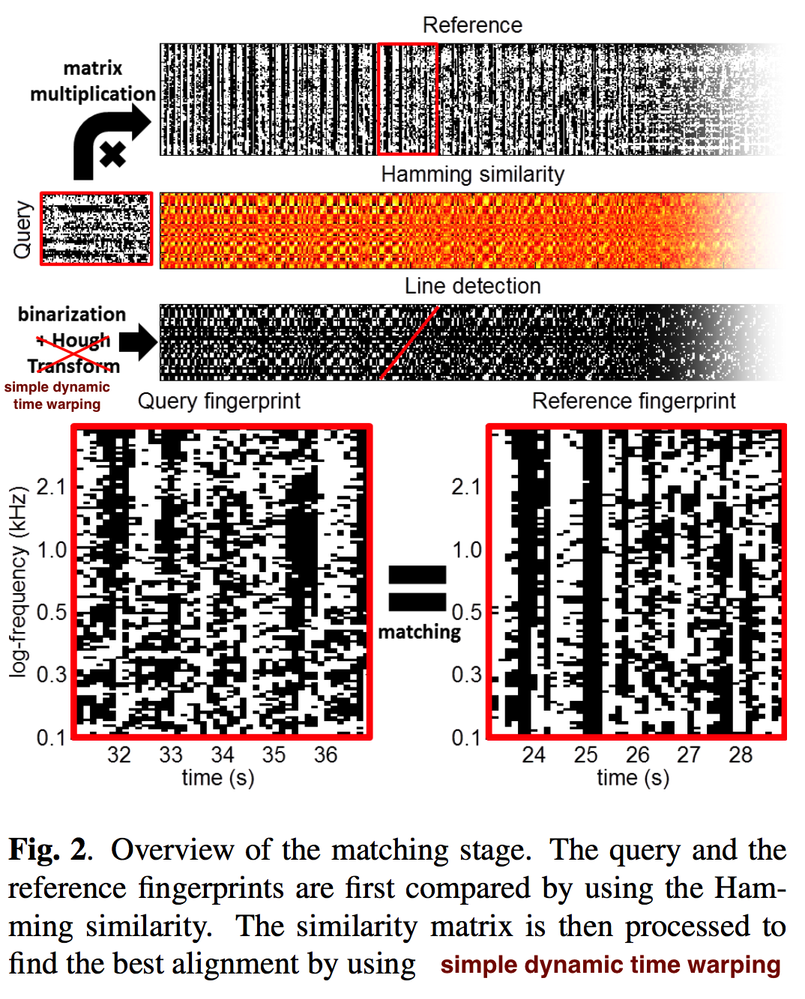

In [50]:
show_figure('matching.png', 400)

This method also gets you 35/80 on covers80.

## The proposed method

We use 2DFT Sequences to represent the audio for cover song identification. What is the 2DFT and why should we use it?

### The 2D Fourier transform

The 2DFT breaks down images into sums of sinusoidal grids at different periods and orientations, represented by points in the 2DFT.

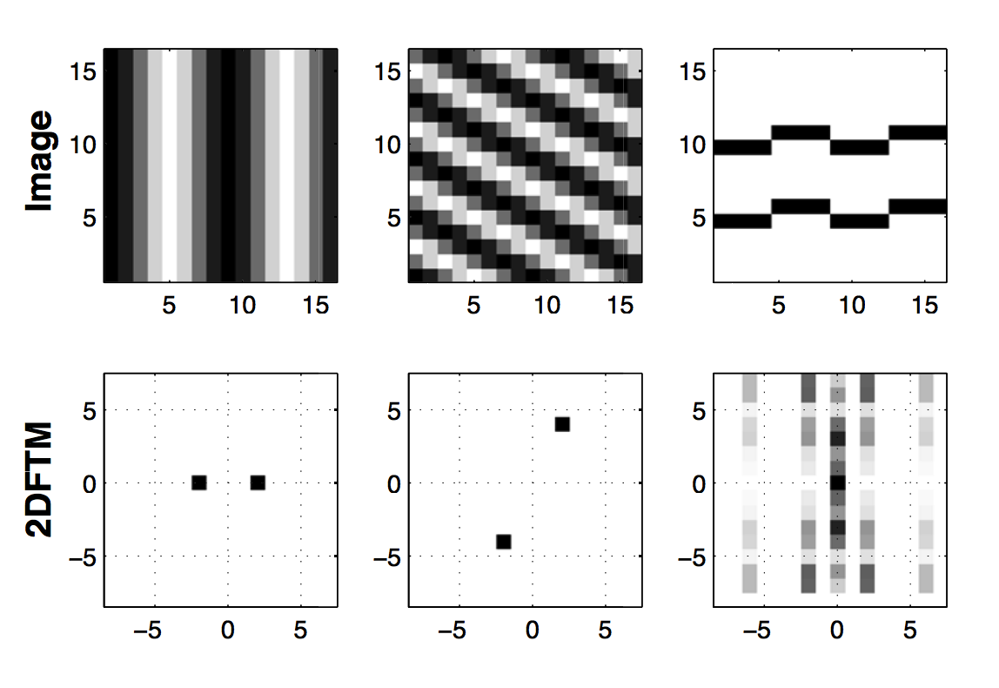

In [51]:
show_figure('2dft.png', 400)

In the magnitude 2DFT, the exact position of these periodic patterns is not known. All of that information is kept in the phase, just like the 1DFT. This is great for transforms where linear translations correspond to musically relevant things. In the CQT, key changes are encoded simply by linear shifts in the frequency direction. Time skews (not tempo differences, but just patterns starting later or earlier) are encoded by linear shifts in the time direction. Check it out:

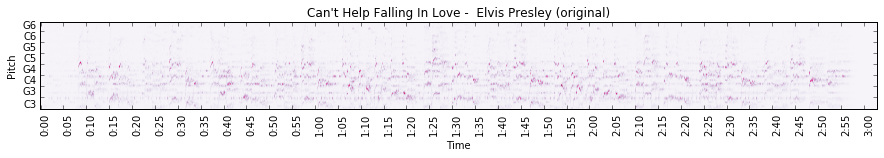

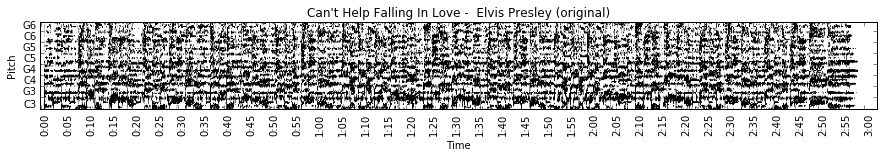

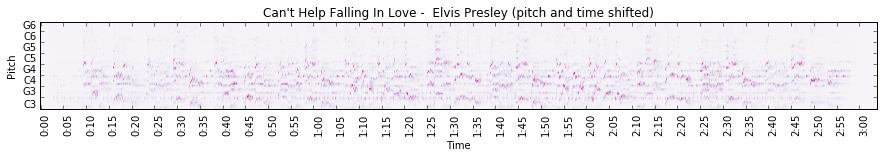

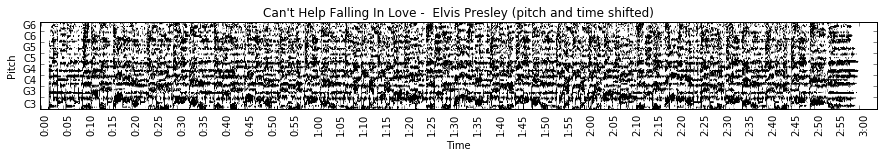

In [212]:
load_and_display("../datasets/Elvis Presley - Can't Help Falling In Love/Can't Help Falling In Love-5V430M59Yn8.mp3", 
                 "Can't Help Falling In Love -  Elvis Presley (original)", 2)
load_and_display("Can't Help Falling In Love_pitch_shift_time_shift.wav", 
                 "Can't Help Falling In Love -  Elvis Presley (pitch and time shifted)", 2)

The key is shifted up by 6 semitones, and that corresponds to a linear shift along the frequency axis. The whole song also starts later. All of this change will be in the phase of the 2DFT of the images. So we if we take the 2DFT of the two images, and throw away the phase, they should be about the same (except for some information lost by the frequency limits of the CQT).

In [213]:
shift_fp = load_file("Can't Help Falling In Love_pitch_shift_time_shift.wav")[-1]

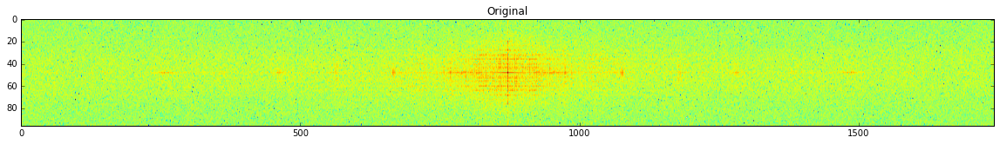

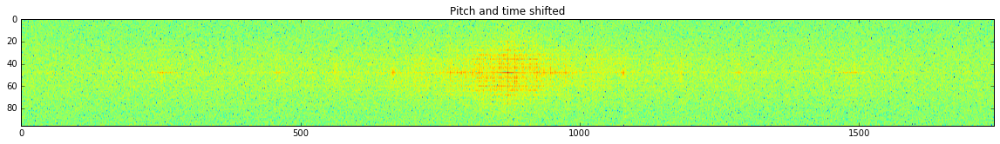

In [221]:
import numpy as np
from scipy.spatial.distance import euclidean

song_fft = np.fft.fft2(song_fp)
song_fft = np.abs(np.fft.fftshift(song_fft))

shift_fft = np.fft.fft2(shift_fp)
shift_fft = np.abs(np.fft.fftshift(shift_fft))[:, shift_fft.shape[1]/2 - song_fft.shape[1]/2:shift_fft.shape[1]/2 + song_fft.shape[1]/2]

plt.figure(figsize=(20, 8))
plt.imshow(np.log(song_fft)**.65, aspect = 2)
plt.title('Original')
plt.show()
plt.figure(figsize=(20, 8))
plt.imshow(np.log(shift_fft)**.65, aspect = 2)
plt.title('Pitch and time shifted')
plt.show()

Yeah, about the same! So the 2DFT after discarding the phase, on a Constant Q Transform is key invariant. This is very useful for cover song identification. Obviously, the first thing I tried was just taking the 2DFT of every original and cover as above, discarding the phase, and using Euclidean distance as a distance measure to find the original song. This method had the advantage of being really really fast, but it wasn't great - it only got me 12/80 songs. Still, it shows there is still some discriminative power in the 2DFT, and inspired the proposed method.

### 2DFT Sequences

We can combine two ideas here: the LiveID subsequence matching (splitting into 20 second windows with some overlap), and the 2DFT on the whole song/cover. Instead of trying to do it on the whole cover all at once, we can use the 2DFT on 20 second windows with 16 second overlap to do the similarity matrix. Then, instead of using global dynamic time warping, we can do subsequence matching of these 2DFTs for the distance measure.
 
Let's give it a shot, here's some code that will take 2DFTs sliding over the LiveID fingerprint at 20 second windows, with a 16 second overlap (4 second hop).

In [91]:
from scipy.ndimage.filters import gaussian_filter

fingerprint_parameters = {
    'window_seconds': 20,
    'hop_factor': .2
}

def fingerprint_fft(raw_fingerprint, audio_parameters, fingerprint_parameters):
    window_seconds = fingerprint_parameters['window_seconds']
    hop_factor = fingerprint_parameters['hop_factor']
    sample_rate = audio_parameters['sample_rate']
    window_length = window_seconds*audio_parameters['time_resolution']
    ffts = []
    start = 0
    while start <= raw_fingerprint.shape[1] - window_length:
        fft = np.fft.fft2(raw_fingerprint[:, start:start+window_length])
        fft = gaussian_filter(np.abs(np.fft.fftshift(fft)), sigma=.375)
        #fft = np.abs(np.fft.fftshift(fft))
        ffts.append(fft)
        start += int(window_length * hop_factor)   
    return ffts

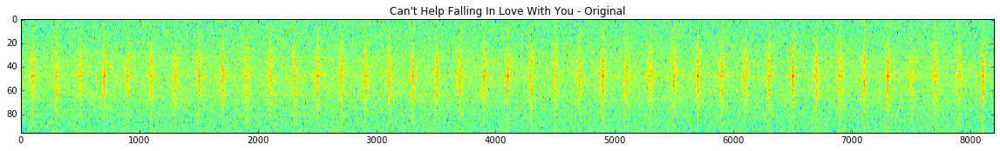

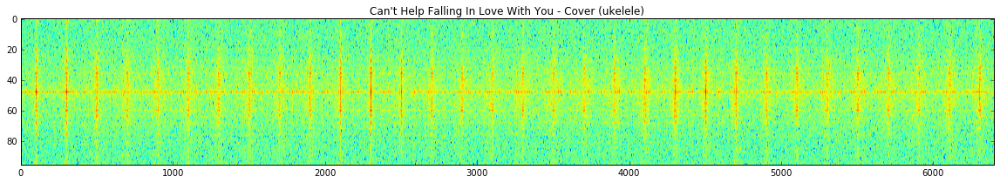

In [113]:
song_ffts = fingerprint_fft(song_fp, ap, fingerprint_parameters)
cover_ffts = fingerprint_fft(cover_fp, ap, fingerprint_parameters)
plt.figure(figsize=(20, 4))
plt.imshow(np.log(np.hstack(song_ffts))**.5, aspect = 10)
plt.title("Can't Help Falling In Love With You - Original")
plt.show()

# plt.figure(figsize=(20, 4))
# plt.imshow(np.log(np.hstack(cover_ffts))**.5, aspect = 10)
# plt.title("Can't Help Falling In Love With You - Pitch shifted")
# plt.show()

plt.figure(figsize=(20, 4))
plt.imshow(np.log(np.hstack(cover_ffts))**.5, aspect = 10)
plt.title("Can't Help Falling In Love With You - Cover (ukelele)")
plt.show()

Above are two 2DFT sequences for the cover and reference that didn't match from before. We can now compute pairwise Euclidean distance between each 2DFT in the sequence.

(19200, 32)
(19200, 41)


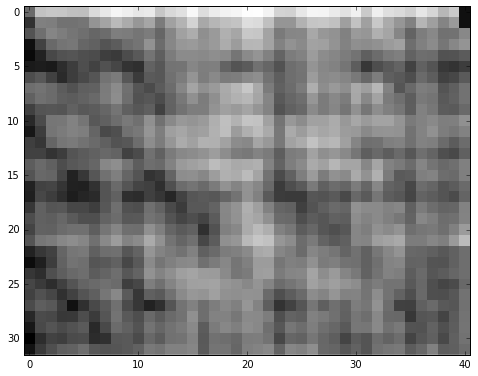

In [117]:
from scipy.spatial.distance import *

def fft_sequence_similarity(ffts_query, ffts_reference):
    ffts_query = np.vstack([f.flatten() for f in ffts_query]).T
    print ffts_query.shape
    ffts_reference = np.vstack([f.flatten() for f in ffts_reference]).T
    print ffts_reference.shape
    similarities = cdist(ffts_query.T, ffts_reference.T, 'euclidean')
    energy = np.mean(similarities)
    similarities = similarities / np.max(similarities)
    return 1 - similarities, energy

sim, energy = fft_sequence_similarity(cover_ffts, song_ffts)
plt.figure(figsize=(8, 8))
plt.imshow(sim, cmap='Greys', interpolation='none')
plt.show()

We can see some diagonals in the similarity matrix! To make these more prominent we can *convolve* the similarity matrix with a checkerboard kernel as follows:

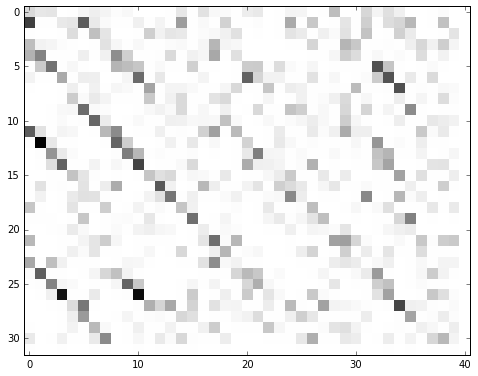

In [119]:
from scipy.ndimage import convolve

def filter_similarity_matrix(S):
    filtered = np.copy(S)
    filtered = filtered  / np.max(filtered)
    kernel = np.array([[1, -1], [-1, 1]])
    filtered = convolve(filtered, kernel)
    filtered[filtered < 0] = 0
    return filtered

filtered = filter_similarity_matrix(sim)
plt.figure(figsize=(8, 8))
plt.imshow(filtered, cmap='Greys', interpolation='none')
plt.show()

The code above takes the similarity matrix, convolves it with the checkerboard pattern, and sets anything in the convolved similarity matrix that is negative to 0. These are elements who locally do not belong to a strong diagonal match.

Almost there...the diagonals can be seen well now, but there's still a small problem - the cover is slightly faster than the original, making the diagonals appear a bit jagged and not clear. In fact, it's around 5% faster. 

Fear not, there's a straightforward hack to deal with this!

### Resampling references

Recall that the magnitude 2DFT is key invariant. Also recall that changing the sample rate of an audio file cuases a time stretch as well as a pitch shift. Well the pitch shift goes away because the magnitude 2DFT is invariant to that. So if we just take a reference, resample it at different sample rates and look at the similarity matrix for each. Here are the similarity matrices at a bunch of different sample rates:

In [251]:
from fft_sequence_fingerprint import *

scales = [.9, .95, 1, 1.05]
resampled_references = []
song, sr = librosa.load("../datasets/Elvis Presley - Can't Help Falling In Love/Can't Help Falling In Love-5V430M59Yn8.mp3")

for s in scales:
    ap['sample_rate'] = s*sr
    song_fp = fingerprint(song, ap)[1]
    song_ffts = fingerprint_fft(song_fp, ap, fingerprint_parameters)
    resampled_references.append(song_ffts)
    
cover, sr = librosa.load("../datasets/Elvis Presley - Can't Help Falling In Love/Can't Help Falling in Love - Elvis Presley (Ukulele Cover by Stormy Amorette)-qlwnRhlh7ts.mp3")
ap['sample_rate'] = sr
cover_fp = fingerprint(cover, ap)[1]
cover_ffts = fingerprint_fft(cover_fp, ap, fingerprint_parameters)

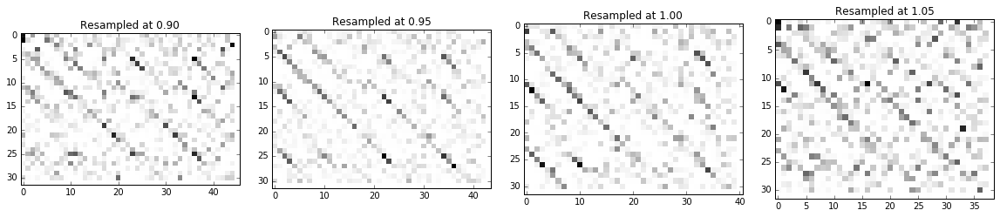

In [252]:
import matplotlib.gridspec as gridspec

plt.figure(figsize = (20,6))
gs = gridspec.GridSpec(1, len(scales))
gs.update(wspace=.15, hspace=.5)

for i, r in enumerate(resampled_references):
    plt.subplot(gs[i])
    sim = filter_similarity_matrix(fft_sequence_similarity(cover_ffts, r)[0])
    plt.imshow(sim, cmap='Greys', interpolation='none', aspect = 1)
    plt.title('Resampled at %.2f' % scales[i])
    
plt.show()

The diagonal are clearest at the .95 resampling factor (which corresponds to a ~5% speedup in the cover!). Let's look at it more closely:

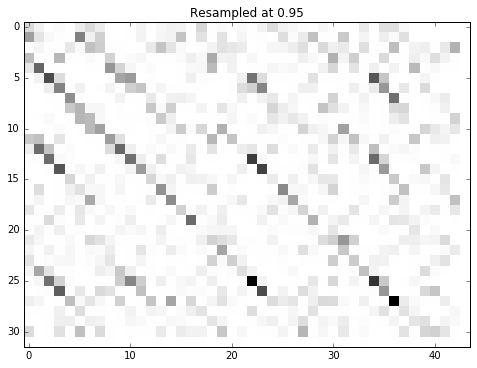

In [147]:
sim = filter_similarity_matrix(fft_sequence_similarity(cover_ffts, resampled_references[1])[0])
plt.figure(figsize=(8, 8))
plt.imshow(sim, cmap='Greys', interpolation='none', aspect = 1)
plt.title('Resampled at %.2f' % scales[1])
plt.show()

Now that we know how to compute similarity, all that's left is to compute a distance measure.

### Computing distance

Our distance measure has to be robust to music structure changes (e.g. a skipped verse, an added intro or outro). We propose a very simple distance measure extracted from the similarity matrix above. We just look at non-zero sequences along the diagonals of the similarity matrix and count the length and weight of every discovered sequence. These are subsequence matches. Here's some code:

In [ ]:
def find_diagonals(S):
    diagonals = []
    diagonal_locations = []
    for i in range(-max(S.shape) + 1, max(S.shape)):
        diag = S.diagonal(i)
        diag_indices = get_diagonal_indices(S.shape, i)
        current_length = 0
        current_weight = 0
        for j in range(0, len(diag)):
            if diag[j] > 0 and j != len(diag):
                current_length += 1
                current_weight += diag[j]
            else:
                if current_length > 1:
                    if j == len(diag) - 1 and diag[j] > 0:
                        current_weight += diag[j]
                        current_length += 1
                        diagonal_locations.append((diag_indices[j - current_length], diag_indices[j]))
                    else:
                        diagonal_locations.append((diag_indices[j - current_length], diag_indices[j-1]))
                    diagonals.append(current_length*current_weight)   
                current_length = 0
                current_weight = 0
    zipped = zip(diagonals, diagonal_locations)
    zipped = sorted(zipped, reverse=True, key = lambda x: x[0])
    return [x[0] for x in zipped], [x[1] for x in zipped]

All it does is it looks along each diagonal of the similarity matrix, breaks it up into non-zero sequences, and records the product of the weight and the length of each diagonal, as well as the location of the diagonal. We do this on every resampled reference. So we compute distance as follows:

In [149]:
def measure_distance(query_fingerprint, references):
    min_distance = np.inf
    for reference_fingerprint in references:
        if len(reference_fingerprint) != 0 and len(query_fingerprint) != 0:
	    sim_matrix, energy = fft_sequence_similarity(query_fingerprint, reference_fingerprint)
	    filtered = filter_similarity_matrix(sim_matrix)
	    diagonals, offsets = find_diagonals(filtered)
	    significant_diagonals = np.sum(diagonals[:3])
	    distance = energy/(significant_diagonals + .01)
        if distance < min_distance:
            min_distance = distance
    return min_distance, offsets

So: for each reference,
1. Compute the similarity matrix. 
2. The mean of the similarity matrix, before normalization, is saved as "energy".
3. Filter it by convolving it with a checkerboard kernel
4. Find the diagonal subsequences in the similarity matrix
5. Sum up the top 3 diagonals scores (weight\*length).
6. Distance is the energy divided by the sum of the dominant diagonals.

Take the minimum distance across all references as the final distance between the query and the reference. Let's see it in action!

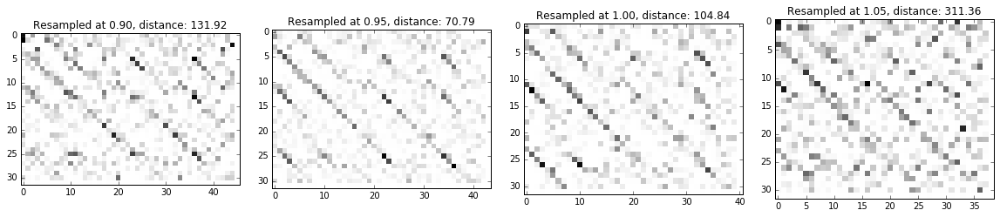

In [151]:
plt.figure(figsize = (20,6))
gs = gridspec.GridSpec(1, len(scales))
gs.update(wspace=.15, hspace=.5)

for i, r in enumerate(resampled_references):
    plt.subplot(gs[i])
    distance = measure_distance(cover_ffts, [r])[0]
    sim = filter_similarity_matrix(fft_sequence_similarity(cover_ffts, r)[0])
    plt.imshow(sim, cmap='Greys', interpolation='none', aspect = 1)
    plt.title('Resampled at %.2f, distance: %.2f' % (scales[i], distance))
    
plt.show()

The lowest distance is the one with the best diagonals! Finally, here is the distance measure visualized on the similarity matrix:

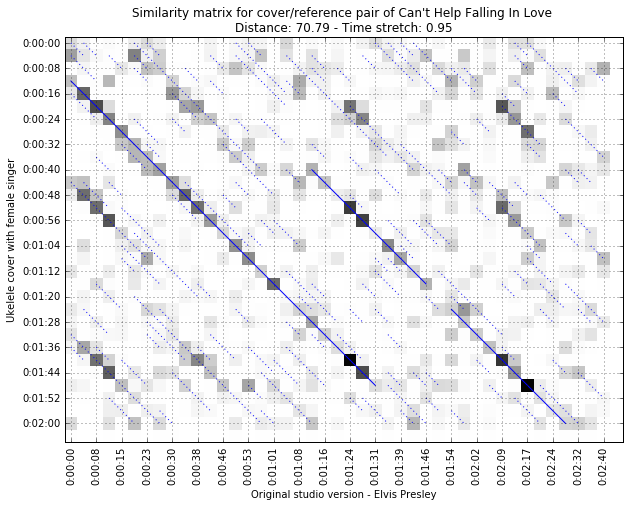

In [253]:
def show_similarity_matrix(S, t, stretch, y, x, offsets, size = (10, 10)):
    plt.figure(figsize=size)
    plt.imshow(S, cmap='Greys', interpolation='none')
    plt.title(t)
    plt.yticks(range(S.shape[0])[::2], [str(datetime.timedelta(seconds=np.round(20*.2*i, 0))) 
                                   for i in range(S.shape[0])][::2])
    plt.xticks(range(S.shape[1])[::2], [str(datetime.timedelta(seconds=np.round(20*.2*i*stretch, 0))) 
                                   for i in range(S.shape[1])][::2], rotation='vertical')
    plt.grid()
    plt.ylabel(y)
    plt.xlabel(x)
    for i, d in enumerate(offsets):
        #plt.text(d[0][1], d[0][0], d[0], color='g', horizontalalignment='center')
        #plt.text(d[1][1], d[1][0], d[1], color='r', horizontalalignment='center')
        if i < 3:
            plt.plot([d[0][1], d[1][1]], [d[0][0], d[1][0]], color='b')
        else:
            plt.plot([d[0][1], d[1][1]], [d[0][0], d[1][0]], color='b', linestyle='dotted')
    plt.show()
    
sim = filter_similarity_matrix(fft_sequence_similarity(cover_ffts, resampled_references[1])[0])
distance, offsets = measure_distance(cover_ffts, [resampled_references[1]])
t = 'Similarity matrix for cover/reference pair of Can\'t Help Falling In Love \nDistance: %.2f - Time stretch: %.2f' % (distance, scales[1])
show_similarity_matrix(sim, t, scales[1],
                           'Ukelele cover with female singer', 
                           'Original studio version - Elvis Presley',
                            offsets)

The dashed and solid blue diagonals are every subsequence match between the cover and the reference. The solid blue ones are the ones used in the distance measure. We can listen to the subsequences at the solid blue lines. Remember that the window is 20 seconds long, meaning that the match resolution will not be exact, but rather a similar pattern will be there somewhere in the 20 seconds.

In [185]:
audio(cover[sr*12:sr*52], sr)
audio(song[int((1/.95)*sr*0):int((1/.95)*sr*40)], (1/.95)*sr)

In [186]:
audio(cover[sr*40:sr*76], sr)
audio(song[int((1/.95)*sr*72):int((1/.95)*sr*106)], (1/.95)*sr)

In [167]:
audio(cover[sr*84:sr*120], sr)
audio(song[int((1/.95)*sr*114):int((1/.95)*sr*148)], sr)

Great, we have a similarity measure for these sequences, and now a distance measure computed from the similarity matrix! How does it do on cover song datasets?

## Evaluation

We did our parameter and algorithmic tuning on Covers80. We evaluated our method on Youtube Covers.

Covers80 is a set of 80 original songs and 80 covers of the originals. The goal is to match the cover songs to the originals (obviously). Our best parameters are as they are in this notebook. They got us 44/80.

The Youtube Covers dataset consists of 50 compositions, with 7 recordings of each. Of these recordings, 1 is the original studio version, 1 is a live version performed by the original artist, and 5 are covers drawn from YouTube. The reference set consists of the original studio versions and the live versions for each composition. The query set consists of the 5 covers for each composition. In all, the size of the reference set is 100, and the size of the query set is 250. In the experiment, we take each query and compare to every reference, getting a distance for each query/reference pair. We then rank the references for each query, and compute the mean average precision, the precision at 10, and the mean rank of the first correctly identified cover.

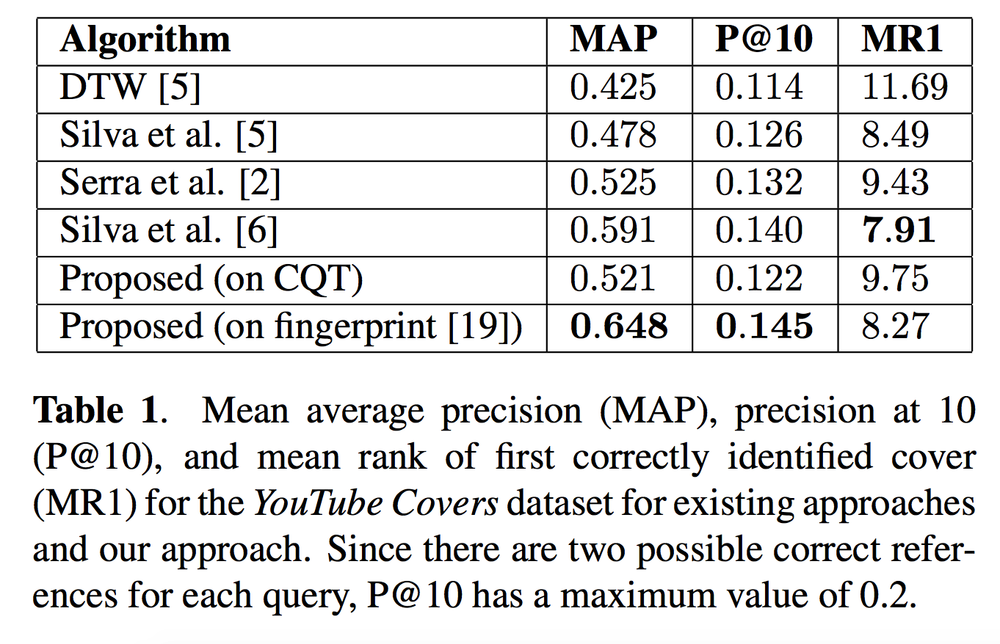

In [217]:
show_figure('youtubecovers.png', 500)

### Effect of the LiveID Fingerprint

The effect of the LiveID Fingerprint is remarkable. When doing the same approach on just the CQT, we get terrible results, comparatively. When using the fingerprint, we become the best performing method, in terms of MAP and P@10. To see this, let's look at the similarity matrices for the following song and cover, once using the CQT, and once using the LiveID fingerprint. 

In [261]:
foo_song = load_file("../datasets/Foo Fighters - Everlong/Foo Fighters - Everlong-eBG7P-K-r1Y.mp3", 1.05)
foo_cover = load_file("../datasets/Foo Fighters - Everlong/Foo Fighters - Everlong - Acoustic Cover-wQvrezVYBQw.mp3")

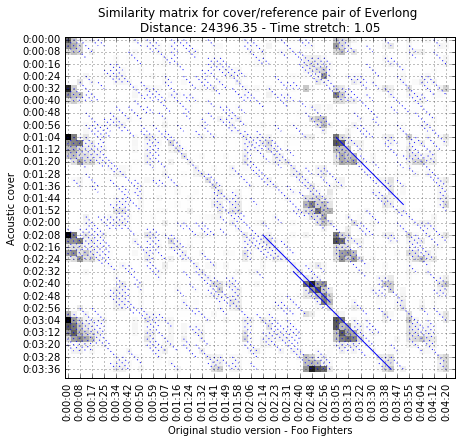

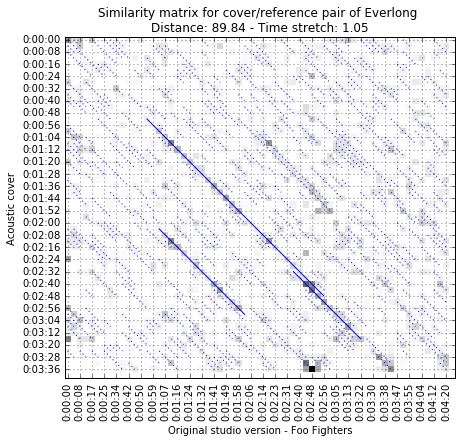

In [262]:
for i in range(2, len(foo_cover)):
    cover_ffts = fingerprint_fft(foo_cover[i], ap, fingerprint_parameters)
    song_ffts = fingerprint_fft(foo_song[i], ap, fingerprint_parameters)
    distance, offsets = measure_distance(cover_ffts, [song_ffts])
    sim = filter_similarity_matrix(fft_sequence_similarity(cover_ffts, song_ffts)[0])
    t = 'Similarity matrix for cover/reference pair of Everlong \nDistance: %.2f - Time stretch: %.2f' % (distance, 1.05)
    show_similarity_matrix(sim, t, 1.05,
                           'Acoustic cover', 
                           'Original studio version - Foo Fighters',
                            offsets, (7, 7))

Let's check out that main subsequence match in the middle.

In [265]:
audio(foo_cover[0][sr*52:sr*92], sr)
audio(foo_song[0][int((1/1.05)*sr*54):int((1/1.05)*sr*94)], (1/1.05)*sr)

We have presented an approach for cover song identification that uses a time-series representation of audio based on the magnitude 2DFT. The audio is represented as a sequence of magnitude 2D Fourier transforms. The representation is robust to key changes, timbral changes, and small local tempo deviations. We look at similarity between these time-series representations, and extract a distance measure that is invariant to structural changes. We note that the adaptive thresholding is an important pre-processing step. Our approach is state-of-the-art on a cover song dataset, and expands on previous work using the 2DFT for music representation.


# Helper functions

In [241]:
import IPython
from IPython.display import Image
import random
import librosa
import string
import ffmpy
import os
import matplotlib.pyplot as plt
%matplotlib inline
from liveid import *
import datetime

ap = parameters()

def load_file(file_name, scale=1):
    x, sr = librosa.load(file_name)
    ap['sample_rate'] = sr*scale
    cqt, fp = fingerprint(x, ap)
    return x, sr, cqt, fp

def show_figure(fig_path, width):
    IPython.display.display(Image(fig_path, width = width))

def load_and_display(audio_path, title, aspect):
    audio_signal, sr, audio_cqt, audio_fp = load_file(audio_path)
    display_spectrogram_and_audio(audio_cqt, audio_fp, audio_signal, sr, title, aspect)
    
def display_spectrogram(stft, title, cmap, aspect):
    notes = ['C3', 'G3', 'C4', 'G4', 'C5', 'G5', 'C6', 'G6']
    numbers = np.array([0, 7, 13, 19, 25, 31, 37, 43])*2
    plt.figure(figsize=(15, 8))
    plt.imshow(stft, origin='lower', cmap=cmap, aspect = aspect)
    plt.title(title)
    plt.xticks(range(stft.shape[1])[::50], [str(datetime.timedelta(seconds=np.round(i / 10)))[3:] 
                                   for i in range(stft.shape[1])][::50], ha='left', rotation='vertical')
    plt.ylim([0, stft.shape[0]])
    plt.yticks(numbers, notes, va='bottom')
    plt.ylabel('Pitch')
    plt.xlabel('Time')
    plt.show()
    
def display_spectrogram_and_audio(cqt, fp, audio_signal, sr, title, aspect):
    display_spectrogram(cqt, title, 'PuRd', aspect)
    display_spectrogram(fp, title, 'Greys', aspect)
    audio(audio_signal, sr)

def audio(d, sr):
    tmp_file = 'tmp.mp3'
    file_path = 'tmp.wav'
    librosa.output.write_wav('tmp.wav', d, sr)
    ff = ffmpy.FFmpeg(
        inputs={file_path: None},
        outputs={tmp_file: None})
    ff.run()
    IPython.display.display(IPython.display.Audio(tmp_file))
    os.remove('tmp.mp3')
    os.remove('tmp.wav')
    
from IPython.core.display import HTML
HTML("""
<style>
audio {
    width: 100%;
}
.output_png {
    text-align: center;
}
</style>
""")